# Чем лучше бустить? Тестируем алгоритмы бустинга в бою.

Рассмотрим задачу предсказания пожизненной ценности клиентов, для обучения будем использовать [этот](https://www.kaggle.com/datasets/pankajjsh06/ibm-watson-marketing-customer-value-data?resource=download) датасет.

Импортируем необходимые библиотеки.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler, RobustScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV

Прочитаем и посмотрим сами данные по предсказанию Customer Lifetime Value.

In [2]:
df_path = 'WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv'
df = pd.read_csv(df_path, delimiter=',')

In [3]:
df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,...,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,...,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,...,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,...,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [4]:
df.tail()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
9129,LA72316,California,23405.987980,No,Basic,Bachelor,2/10/11,Employed,M,71941,...,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.234764,Four-Door Car,Medsize
9130,PK87824,California,3096.511217,Yes,Extended,College,2/12/11,Employed,F,21604,...,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.200000,Four-Door Car,Medsize
9131,TD14365,California,8163.890428,No,Extended,Bachelor,2/6/11,Unemployed,M,0,...,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.784983,Four-Door Car,Medsize
9132,UP19263,California,7524.442436,No,Extended,College,2/3/11,Employed,M,21941,...,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.200000,Four-Door Car,Large
9133,Y167826,California,2611.836866,No,Extended,College,2/14/11,Unemployed,M,0,...,90,0,1,Corporate Auto,Corporate L3,Offer4,Call Center,369.600000,Two-Door Car,Medsize


Посмотрим, какие есть признаки, можно ли избавиться от некоторых.

In [5]:
df.columns

Index(['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size'],
      dtype='object')

Поскольку названия признаков отражают суть, подготовим описание каждого.  

`Customer`: Уникальный идентификатор для каждого клиента.  
`State`: Штат, где живет клиент.  
`Customer Lifetime Value`: Общая сумма денег, которую ожидается, что клиент потратит на продукты компании на протяжении всего периода их взаимодействия.  
`Response`: Бинарный признак, указывающий, отреагировал ли клиент на маркетинговую кампанию или нет.  
`Coverage`: Тип страховки клиента.  
`Education`: Уровень образования клиента.  
`Effective To Date`: Дата, до которой страховка действительна.  
`EmploymentStatus`: Статус занятости клиента.  
`Gender`: Пол клиента.  
`Income`: Годовой доход клиента.  
`Location Code`: Тип населенного пункта, где живет клиент (городской, пригородный или сельский).  
`Marital Status`: Семейное положение клиента.  
`Monthly Premium Auto`: Ежемесячная сумма, которую клиент платит за свою автостраховку.  
`Months Since Last Claim`: Количество месяцев с момента последнего страхового случая у клиента.  
`Months Since Policy Inception`: Количество месяцев с начала действия страховки клиента.  
`Number of Open Complaints`: Количество открытых жалоб, которые имеет клиент на компанию.  
`Number of Policies`: Количество страховых полисов, которые имеет клиент у компании.  
`Policy Type`: Тип тарифа страхового полиса, которым обладает клиент.  
`Policy`: Тариф страхового полиса клиента.  
`Renew Offer Type`: Тип предложения о продлении, которое получил клиент.  
`Sales Channel`: Канал продаж.  
`Total Claim Amount`: Общая сумма денег, которую клиент запрашивал со своего страхового полиса.  
`Vehicle Class`: Класс автомобиля, за который клиент застрахован.  
`Vehicle Size`: Размер автомобиля клиента.  

Убедимся, что столбец `Customer` хранит уникальные коды каждого объекта измерений.

In [6]:
len(pd.unique(df['Customer'])) == df.shape[0]

True

Столбец `Effective To Date` хранит даты. Полезное применение этого признака в чистом или трансформированном виде для решения этой задачи не вижу. 

In [7]:
pd.to_datetime(pd.unique(df['Effective To Date']))

DatetimeIndex(['2011-02-24', '2011-01-31', '2011-02-19', '2011-01-20',
               '2011-02-03', '2011-01-25', '2011-01-18', '2011-01-26',
               '2011-02-17', '2011-02-21', '2011-01-06', '2011-02-06',
               '2011-01-10', '2011-01-17', '2011-01-05', '2011-02-27',
               '2011-01-14', '2011-01-21', '2011-02-05', '2011-01-29',
               '2011-02-28', '2011-02-12', '2011-02-02', '2011-02-07',
               '2011-01-22', '2011-02-13', '2011-01-15', '2011-01-08',
               '2011-01-11', '2011-01-28', '2011-02-08', '2011-02-23',
               '2011-01-02', '2011-02-16', '2011-01-27', '2011-01-23',
               '2011-01-09', '2011-02-11', '2011-02-04', '2011-02-01',
               '2011-02-15', '2011-02-26', '2011-01-16', '2011-01-01',
               '2011-02-10', '2011-01-24', '2011-02-25', '2011-01-12',
               '2011-02-09', '2011-01-19', '2011-01-04', '2011-02-14',
               '2011-02-20', '2011-02-18', '2011-01-03', '2011-01-13',
      

`Policy Type` и `Policy` подозрительно похожи, посмотрим на уникальные значения в каждом из этих признаков.

In [8]:
print(pd.unique(df['Policy Type']))
print(pd.unique(df['Policy']))

['Corporate Auto' 'Personal Auto' 'Special Auto']
['Corporate L3' 'Personal L3' 'Corporate L2' 'Personal L1' 'Special L2'
 'Corporate L1' 'Personal L2' 'Special L1' 'Special L3']


Считаю, что избавиться стоит от `Customer`, `Effective To Date` и `Policy Type`.

In [9]:
exclude_cols = ['Customer', 'Policy Type', 'Effective To Date']
cols = [col for col in df.columns if col not in exclude_cols]

Проверим, есть ли пропуски в данных.

In [10]:
df[cols].isna().sum()

State                            0
Customer Lifetime Value          0
Response                         0
Coverage                         0
Education                        0
EmploymentStatus                 0
Gender                           0
Income                           0
Location Code                    0
Marital Status                   0
Monthly Premium Auto             0
Months Since Last Claim          0
Months Since Policy Inception    0
Number of Open Complaints        0
Number of Policies               0
Policy                           0
Renew Offer Type                 0
Sales Channel                    0
Total Claim Amount               0
Vehicle Class                    0
Vehicle Size                     0
dtype: int64

Посмотрим, какого типа признаки есть, и проведем соответствующую обработку.

In [11]:
df[cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   State                          9134 non-null   object 
 1   Customer Lifetime Value        9134 non-null   float64
 2   Response                       9134 non-null   object 
 3   Coverage                       9134 non-null   object 
 4   Education                      9134 non-null   object 
 5   EmploymentStatus               9134 non-null   object 
 6   Gender                         9134 non-null   object 
 7   Income                         9134 non-null   int64  
 8   Location Code                  9134 non-null   object 
 9   Marital Status                 9134 non-null   object 
 10  Monthly Premium Auto           9134 non-null   int64  
 11  Months Since Last Claim        9134 non-null   int64  
 12  Months Since Policy Inception  9134 non-null   i

Для начала выделим категориальные признаки, но закодируем их позже, после EDA.  

In [12]:
cat_cols = [col for col in df.select_dtypes('object').columns if col not in exclude_cols]
cat_cols

['State',
 'Response',
 'Coverage',
 'Education',
 'EmploymentStatus',
 'Gender',
 'Location Code',
 'Marital Status',
 'Policy',
 'Renew Offer Type',
 'Sales Channel',
 'Vehicle Class',
 'Vehicle Size']

Теперь определим непрерывные признаки и посмотрим на их статистики.  

In [13]:
num_cols = [col for col in df.select_dtypes(['float', 'int']).columns]
num_cols

['Customer Lifetime Value',
 'Income',
 'Monthly Premium Auto',
 'Months Since Last Claim',
 'Months Since Policy Inception',
 'Number of Open Complaints',
 'Number of Policies',
 'Total Claim Amount']

In [14]:
df[num_cols].describe()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,8004.940475,37657.380009,93.219291,15.097000,48.064594,0.384388,2.966170,434.088794
std,6870.967608,30379.904734,34.407967,10.073257,27.905991,0.910384,2.390182,290.500092
min,1898.007675,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007
25%,3994.251794,0.000000,68.000000,6.000000,24.000000,0.000000,1.000000,272.258244
50%,5780.182197,33889.500000,83.000000,14.000000,48.000000,0.000000,2.000000,383.945434
75%,8962.167041,62320.000000,109.000000,23.000000,71.000000,0.000000,4.000000,547.514839
max,83325.381190,99981.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678


Основные статистики показывают, что как и всегда, для этих данных нужно применить нормирование. Запомним это, чтобы вернуться к этому позже, а пока займемся визуализацией (не делаем нормирование на этом этапе, чтобы оставить исходные значения и не исказить восприятие данных на графиках).

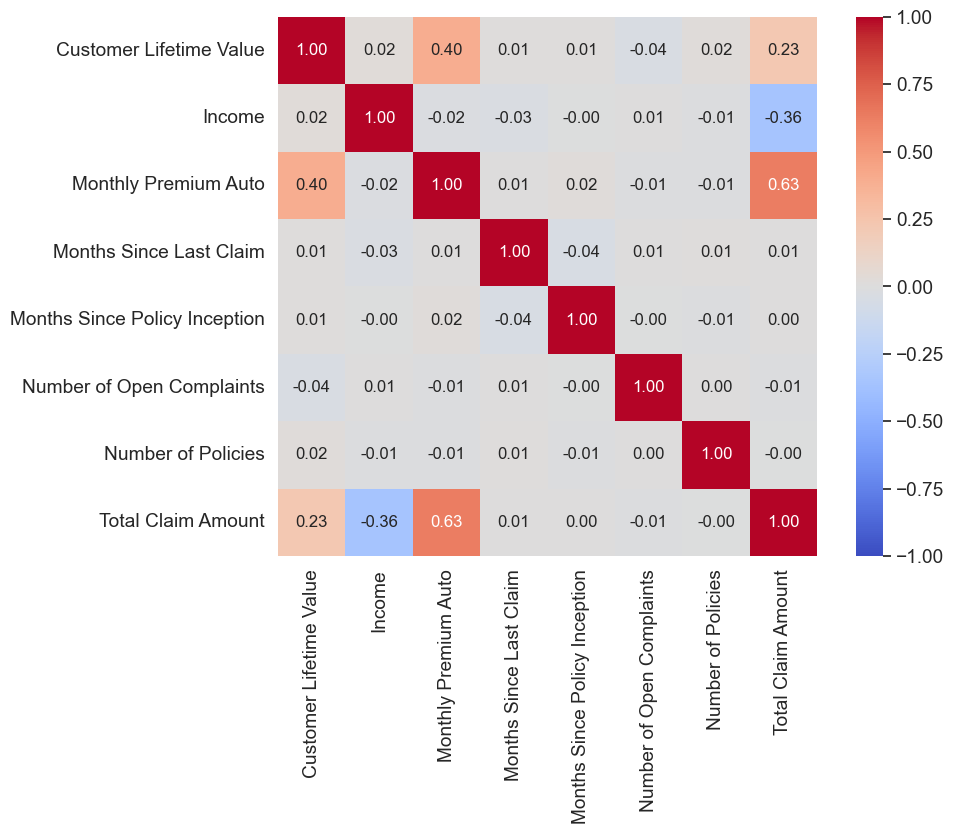

In [15]:
cm = np.corrcoef(df[num_cols].values.T)
plt.figure(figsize=(10,7))
sns.set(font_scale=1.25)
sns.heatmap(
    cm,
    cbar=True,
    annot=True,
    square=True,
    fmt='.2f',
    annot_kws={'size': 12},
    yticklabels=num_cols,
    xticklabels=num_cols,
    vmin=-1,
    center=0,
    cmap=sns.color_palette('coolwarm', 1000)
)
plt.show()

Корреляционная матрица показывает, что целевая переменная `Customer Lifetime Value` в некоторой доле коррелирует с `Monthly Premium Auto` и `Total Claim Amount`, что похоже на правду. В свою очередь, эти 2 признака так же коррелируют между собой. При этом, признак `Income` имеет отрицательную корреляцию с `Total Claim Amount` - и с этим я тоже согласен.  
Завышенной корреляции или каких-либо других подозрительных метрик нет. 

Определим целевую переменную и займемся визуализацией.  

In [16]:
target = 'Customer Lifetime Value'

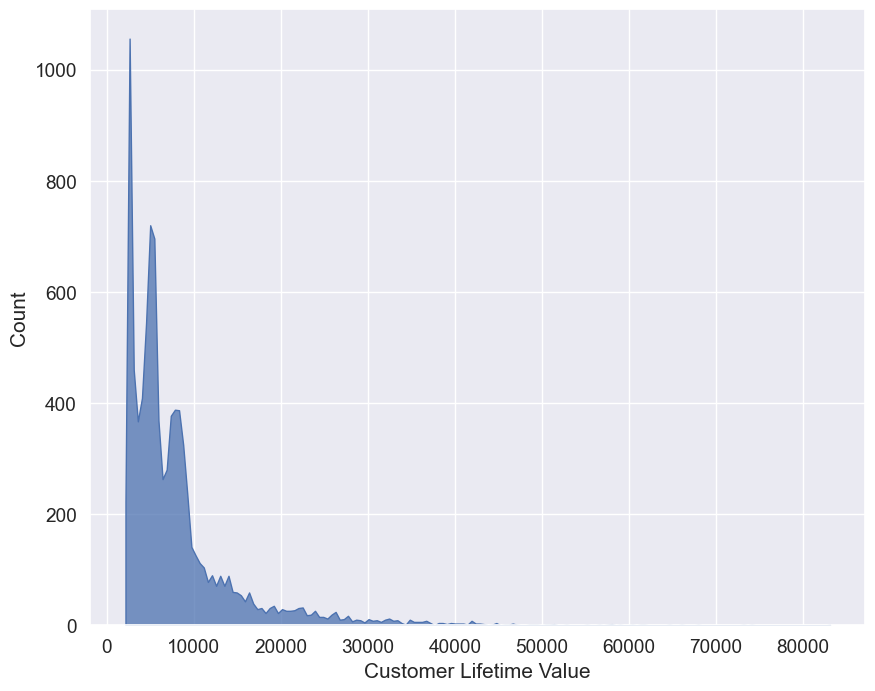

In [17]:
plt.figure(figsize=(10, 8))

sns.histplot(
    x=df[target],
    element='poly',
    fill=True
)

plt.show()

Если рассмотреть подробно график распределения таргета, то видно, что основная масса пространства объектов находится в диапазоне 0-10000.  
Думаю, что если представить условную бизнес-задачу, то она могла бы быть нацелена на выявление значимых факторов, которые позволят добиться смещения центра масс таргета в положительном направлении. Т.е. другими словами, увеличить средний Customer Lifetime Value. И как следствие, научиться предсказывать его (таргета) значение.  

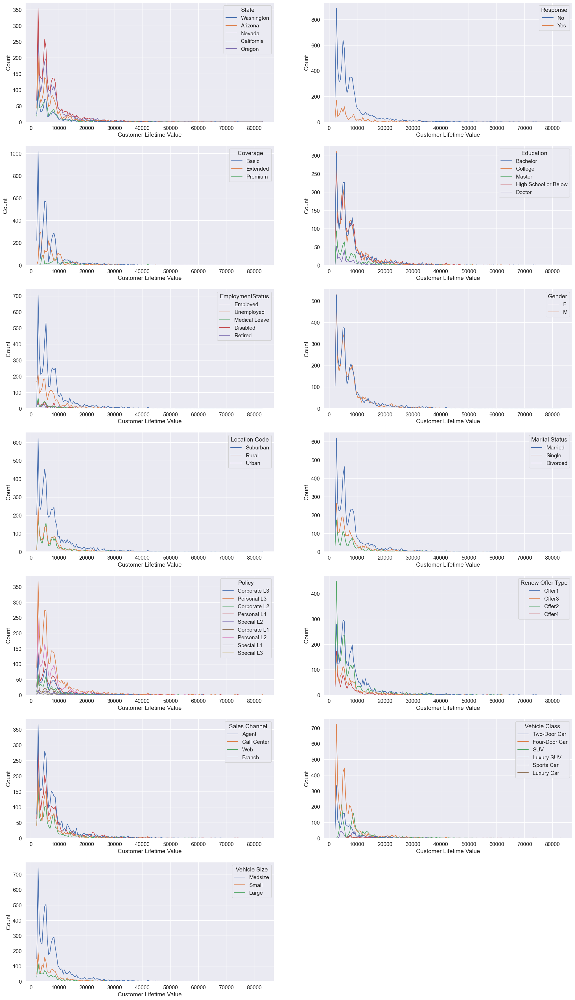

In [18]:
plt.figure(figsize=(25, 45))

for i, col in enumerate(cat_cols):
    
    plt.subplot(7, 2, i+1)
    
    sns.histplot(
        x=df[target],
        hue=df[col],
        element='poly',
        fill=False
    )
    
    plt.xlabel(target)
    
plt.show()

На графиках выше показано распределение целевой переменной по каждому категориальному признаку в разрезе его классов.  
Выводы, которые можно сделать на данном этапе:  
- На маркетинговые предложения чаще дают отказы, и значение признака `Response` не влияет на таргет  
- Таргет не зависит от пола клиента  
- Таргет зависит от `Coverage` - чем дороже страховка, тем больше целевая переменная  
- Таргет зависит от `Vehicle Class` - чем дороже автомобиль, тем больше целевая переменная  

Идем дальше.  
Убедимся в правильности первого вывода, потому что на первый взгляд он кажется противоречивым.  

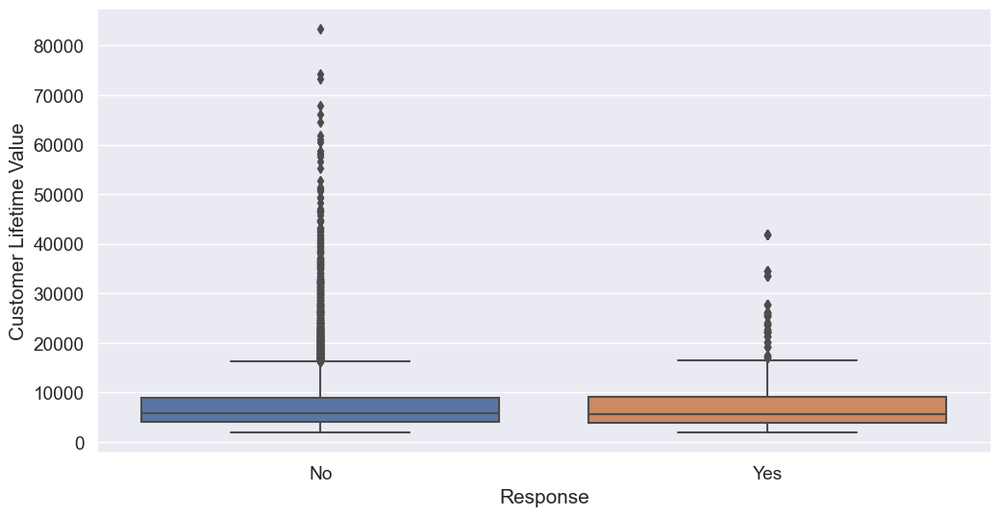

In [19]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df, y='Customer Lifetime Value', x='Response')
plt.show()

Как видно по boxplot'ам, вывод был правильный. Кроме того, если взять во внимаение выбросы, то при отказах от маркетинговых предложений, целевая переменная принимает даже более высокие значения. В остальном же "ящики с усами" практически идентичны.  
Почему так?  
Я думаю, что, возможно, маркетинговыми предложениями обрабатывают холодную базу клиентов, поэтому решающую роль играет, скорее, лояльность клиента. Полагаю, что в данных есть такой латентный признак, и можно попробовать его получить.  
Сделаем это попозже.  

In [20]:
def add_percents(ax, w, h):
    for p in ax.patches:
        ax.annotate(
            f"{p.get_height() * 100 / df.shape[0]:.2f}%",
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center',
            va='center',
            fontsize=11,
            color='black',
            rotation=0,
            xytext=(0, 10),
            textcoords='offset points'
        )

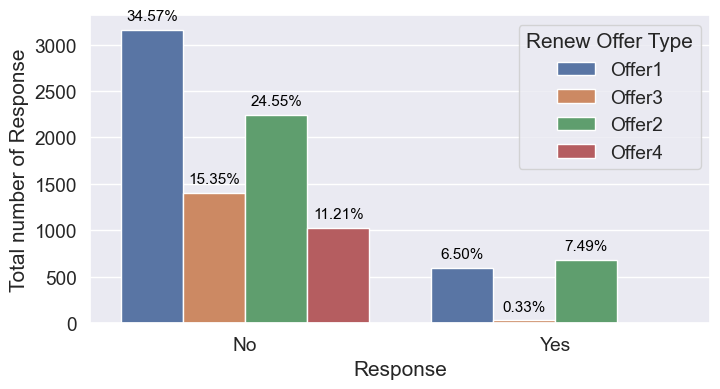

In [21]:
plt.figure(figsize=(8, 4))
ax = sns.countplot(data=df, x='Response', hue='Renew Offer Type')
plt.ylabel('Total number of Response')
plt.legend(title='Renew Offer Type', loc='upper right')
add_percents(ax, 0.08,1)
plt.show()

Тут видно, что на офферы 3 и 4 практически нет положительных ответов. Значит, они не работают, можно не тратить на них ресурсы, а сфокусироваться на оставшихся двух или придумать новые.  

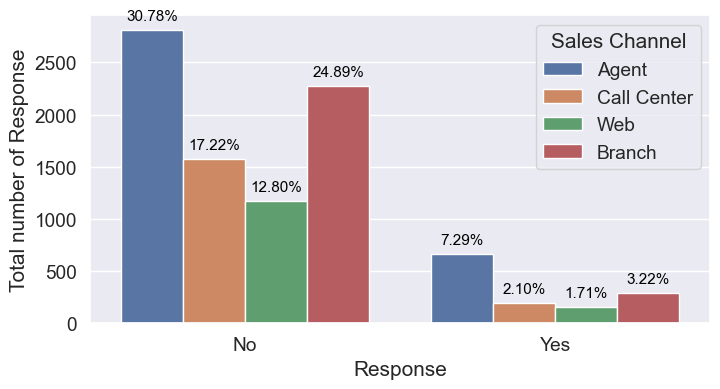

In [22]:
plt.figure(figsize=(8, 4))
ax = sns.countplot(data=df, x='Response', hue='Sales Channel')
plt.ylabel('Total number of Response')
add_percents(ax, 0.08,1)
plt.show()

Тут также видны неэффективные каналы продаж. Например, на канал `Branch` тратится довольно много ресурсов, а результат сильно меньше. Можно попробовать освободить часть ресурсов и перенаправить их на более успешный канал `Agent`. Возможно, в совокупности, получится увеличить количество согласий.  
Посмотрим на распределения оставшихся некатегориальных признаков.  

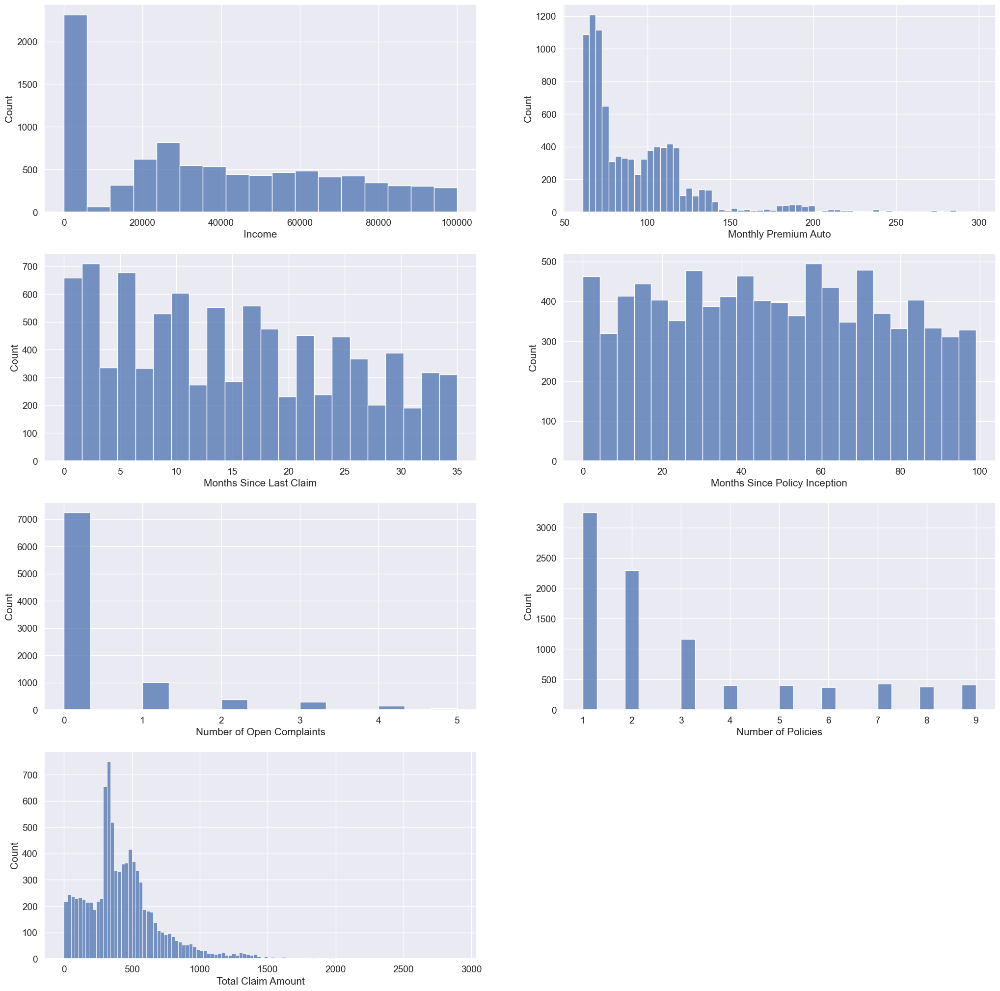

In [23]:
plt.figure(figsize=(25, 45))

for i, col in enumerate([col for col in num_cols if col != target]):
    
    plt.subplot(7, 2, i+1)
    
    sns.histplot(
        x=df[col],
        fill=True
    )
    
    plt.xlabel(col)
    
plt.show()

Вроде нет ничего интересного. Разве что, для нормировани будем использовать RobustScaler, из-за хвостов в распределении.  
Теперь приступим к кодированию и нормированию признаков.  
Кодировать будем OHE, т.к. при нем достигается лучшее качество при обучении.  

In [52]:
cat_features = pd.get_dummies(df[cat_cols])
cat_features.head()

,State_Arizona,State_California,State_Nevada,State_Oregon,State_Washington,Response_No,Response_Yes,Coverage_Basic,Coverage_Extended,Coverage_Premium,...,Sales Channel_Web,Vehicle Class_Four-Door Car,Vehicle Class_Luxury Car,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,Vehicle Size_Large,Vehicle Size_Medsize,Vehicle Size_Small
0,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,0,1,0,1,0
1,1,0,0,0,0,1,0,0,1,0,...,0,1,0,0,0,0,0,0,1,0
2,0,0,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0
3,0,1,0,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0


In [53]:
num_cols = [col for col in num_cols if col != target]
scaler = RobustScaler()
num_features = pd.DataFrame(data=scaler.fit_transform(df[num_cols]), columns=num_cols)
num_features.head()

,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount
0,0.359186,-0.341463,1.058824,-0.914894,0.0,-0.333333,0.003145
1,-0.543798,0.268293,-0.058824,-0.127660,0.0,2.000000,2.715719
2,0.238728,0.609756,0.235294,-0.212766,0.0,0.000000,0.663115
3,-0.543798,0.560976,0.235294,0.361702,0.0,1.666667,0.530181
4,0.159604,-0.243902,-0.117647,-0.085106,0.0,-0.333333,-0.893038


In [54]:
df_processed = pd.concat([df[target], num_features, cat_features], axis=1)
df_processed.head()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount,State_Arizona,State_California,...,Sales Channel_Web,Vehicle Class_Four-Door Car,Vehicle Class_Luxury Car,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,Vehicle Size_Large,Vehicle Size_Medsize,Vehicle Size_Small
0,2763.519279,0.359186,-0.341463,1.058824,-0.914894,0.0,-0.333333,0.003145,0,0,...,0,0,0,0,0,0,1,0,1,0
1,6979.535903,-0.543798,0.268293,-0.058824,-0.127660,0.0,2.000000,2.715719,1,0,...,0,1,0,0,0,0,0,0,1,0
2,12887.431650,0.238728,0.609756,0.235294,-0.212766,0.0,0.000000,0.663115,0,0,...,0,0,0,0,0,0,1,0,1,0
3,7645.861827,-0.543798,0.560976,0.235294,0.361702,0.0,1.666667,0.530181,0,1,...,0,0,0,0,1,0,0,0,1,0
4,2813.692575,0.159604,-0.243902,-0.117647,-0.085106,0.0,-0.333333,-0.893038,0,0,...,0,1,0,0,0,0,0,0,1,0


In [55]:
df_processed.isna().sum()

Customer Lifetime Value          0
Income                           0
Monthly Premium Auto             0
Months Since Last Claim          0
Months Since Policy Inception    0
                                ..
Vehicle Class_Sports Car         0
Vehicle Class_Two-Door Car       0
Vehicle Size_Large               0
Vehicle Size_Medsize             0
Vehicle Size_Small               0
Length: 62, dtype: int64

Подготовим данные для обучения.  

In [56]:
y_column = target
X_columns = df_processed.drop(columns=[target]).columns

Добавим логарифмирование целевой переменной, т.к. ее распределение сильно смещено вправо.   

In [60]:
X = df_processed[X_columns]
y = np.log1p(df_processed[y_column])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [61]:
def quality(pred_y, true_y):
    rmse = mean_squared_error(true_y, pred_y, squared=False)
    mae = mean_absolute_error(true_y, pred_y)
    r2 = r2_score(true_y, pred_y)
    print(f'RMSE: {round(rmse, 3)}')
    print(f'MAE: {round(mae, 3)}')
    print(f'R2: {round(r2, 3)}')

Попробуем обучить модели "из коробки".  

**1) GradientBoostingRegressor**  

In [62]:
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train)
quality(gbr.predict(X_test), y_test)

RMSE: 0.21
MAE: 0.109
R2: 0.9


**2) CatBoostRegressor**  

In [63]:
df_cat = pd.concat([df[target], num_features, df[cat_cols]], axis=1)
X_cat = df_cat[df_cat.drop(columns=[target]).columns]
y_cat = y.copy()
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X_cat, y_cat, test_size=0.3)

cat = CatBoostRegressor(random_state=42)
cat.fit(X_train_cat, y_train_cat, verbose=False, plot=False, cat_features=cat_cols)
quality(cat.predict(X_test_cat), y_test_cat)

RMSE: 0.197
MAE: 0.103
R2: 0.91


**3) XGBRegressor**  

In [64]:
X_xgb = X_cat.copy()
for col in X_xgb.columns:
    if X_xgb[col].dtype == 'object':
        X_xgb[col] = X_xgb[col].astype('category')
y_xgb = y.copy()
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(X_xgb, y_xgb, test_size=0.3)

xgb = XGBRegressor(random_state=42, tree_method="hist", enable_categorical=True)
xgb.fit(X_train_xgb, y_train_xgb)
quality(xgb.predict(X_test_xgb), y_test_xgb)

RMSE: 0.213
MAE: 0.122
R2: 0.893


**4) LGBMRegressor**  

In [65]:
encoder = LabelEncoder()
X_lgbr = X_cat.copy()
for col in X_lgbr.columns:
    if X_lgbr[col].dtype == 'object':
        X_lgbr[col] = pd.Series(data=encoder.fit_transform(X_lgbr[col]), name=col).astype('category')
y_lgbr = y.copy()
X_train_lgbr, X_test_lgbr, y_train_lgbr, y_test_lgbr = train_test_split(X_lgbr, y_lgbr, test_size=0.3)

lgbr = LGBMRegressor(random_state=42)
lgbr.fit(X_train_lgbr, y_train_lgbr)
quality(lgbr.predict(X_test_lgbr), y_test_lgbr)

RMSE: 0.196
MAE: 0.095
R2: 0.911


Все модели получили примерно одинаковые метрики качества, но впереди LGMBRegressor.  
Попробуем подобрать параметры моделей.  

**1) GradientBoostingRegressor**  

In [66]:
parameters = {'learning_rate': [0.01, 0.025, 0.05], 'max_depth': [4, 6, 8], 'n_estimators': [50, 100, 200]}
gbr = GradientBoostingRegressor(random_state=42)
gbr_cv = GridSearchCV(gbr, parameters)
gbr_cv.fit(X_train, y_train)
print(gbr_cv.best_params_)
print(gbr_cv.best_score_)

{'learning_rate': 0.025, 'max_depth': 6, 'n_estimators': 200}
0.9058915083805317


In [67]:
quality(gbr_cv.best_estimator_.predict(X_test), y_test)

RMSE: 0.207
MAE: 0.1
R2: 0.904


In [75]:
X_imp = pd.DataFrame(gbr_cv.best_estimator_.feature_importances_, columns=['Imp'], index=X.columns)
X_imp = X_imp.sort_values(by='Imp', ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names', fontsize=80)
plt.xticks(rotation=90, fontsize=150)
sns.barplot(x=X_imp.index, y=X_imp['Imp'])

<AxesSubplot:xlabel='Feature Names', ylabel='Imp'>

**2) CatBoostRegressor**  

In [68]:
parameters = {'learning_rate': [0.01, 0.025, 0.05], 'depth': [4, 6, 8], 'iterations': [50, 100, 200]}
cat = CatBoostRegressor(random_state=42, verbose=False)
cat_cv = GridSearchCV(cat, parameters)
cat_cv.fit(X_train_cat, y_train_cat, cat_features=cat_cols)
print(cat_cv.best_params_)
print(cat_cv.best_score_)

{'depth': 8, 'iterations': 200, 'learning_rate': 0.05}
0.9057774318414342


In [69]:
quality(cat_cv.best_estimator_.predict(X_test_cat), y_test_cat)

RMSE: 0.2
MAE: 0.104
R2: 0.908


In [77]:
X_imp = pd.DataFrame(cat_cv.best_estimator_.feature_importances_, columns=['Imp'], index=X_cat.columns)
X_imp = X_imp.sort_values(by='Imp', ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names', fontsize=80)
plt.xticks(rotation=90, fontsize=150)
sns.barplot(x=X_imp.index, y=X_imp['Imp'])

<AxesSubplot:xlabel='Feature Names', ylabel='Imp'>

**3) XGBRegressor**  

In [70]:
parameters = {'learning_rate': [0.01, 0.025, 0.05], 'max_depth': [4, 6, 8], 'n_estimators': [50, 100, 200], 'tree_method': ['hist'], 'enable_categorical': [True]}
xgb = XGBRegressor()
xgb_cv = GridSearchCV(xgb, parameters)
xgb_cv.fit(X_train_xgb, y_train_xgb)
print(xgb_cv.best_params_)
print(xgb_cv.best_score_)

{'enable_categorical': True, 'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 200, 'tree_method': 'hist'}
0.9067959093080242


In [71]:
quality(xgb_cv.best_estimator_.predict(X_test_xgb), y_test_xgb)

RMSE: 0.202
MAE: 0.105
R2: 0.903


In [78]:
X_imp = pd.DataFrame(xgb_cv.best_estimator_.feature_importances_, columns=['Imp'], index=X_xgb.columns)
X_imp = X_imp.sort_values(by='Imp', ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names', fontsize=80)
plt.xticks(rotation=90, fontsize=150)
sns.barplot(x=X_imp.index, y=X_imp['Imp'])

<AxesSubplot:xlabel='Feature Names', ylabel='Imp'>

**4) LGBMRegressor**  

In [72]:
parameters = {'subsample': [0.5, 0.75, 1.0], 'max_depth': [4, 6, 8], 'n_estimators': [100, 500, 1000]}
lgbr = LGBMRegressor()
lgbr_cv = GridSearchCV(lgbr, parameters)
lgbr_cv.fit(X_train_lgbr, y_train_lgbr)
print(lgbr_cv.best_params_)
print(lgbr_cv.best_score_)

{'max_depth': 6, 'n_estimators': 100, 'subsample': 0.5}
0.9050035491578289


In [73]:
quality(xgb_cv.best_estimator_.predict(X_test_lgbr), y_test_lgbr)

RMSE: 0.159
MAE: 0.08
R2: 0.941


In [79]:
X_imp = pd.DataFrame(lgbr_cv.best_estimator_.feature_importances_, columns=['Imp'], index=X_lgbr.columns)
X_imp = X_imp.sort_values(by='Imp', ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names', fontsize=80)
plt.xticks(rotation=90, fontsize=150)
sns.barplot(x=X_imp.index, y=X_imp['Imp'])

<AxesSubplot:xlabel='Feature Names', ylabel='Imp'>

Метрики ожидаемо подросли, в лидерах остался LGBMRegressor. Самые интересные коэффициенты важности признаков получились тоже у него.  